In [3]:
# Data preprocessing
import datetime
import re
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Visualization
from matplotlib import pyplot as plt
import folium
import seaborn as sns

# Random forest
from sklearn.ensemble import RandomForestRegressor
from sklearn.multioutput import MultiOutputRegressor

# parameter opimization
from sklearn.model_selection import GridSearchCV

# Validation
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score

#
import pandas as pd
import numpy as np


In [4]:
# train
train_df = pd.read_csv("train.csv")

In [36]:
len(train_df)

1704769

In [5]:
# Time data preprocessing
train_df["TIMESTAMP"] = [float(time) for time in train_df["TIMESTAMP"]]
train_df["dt"] = [datetime.datetime.fromtimestamp(time, datetime.timezone.utc) for time in train_df["TIMESTAMP"]]

In [6]:
# Time data
train_df["dt"].value_counts()

2014-03-27 19:31:22+00:00    5
2014-03-27 18:49:12+00:00    5
2014-04-10 12:57:28+00:00    5
2014-05-10 03:36:53+00:00    4
2013-10-17 13:02:53+00:00    4
2014-04-24 12:50:45+00:00    4
2014-03-21 12:05:50+00:00    4
2014-05-18 15:05:46+00:00    4
2013-07-10 01:15:30+00:00    4
2013-11-29 12:59:30+00:00    4
2014-04-09 08:45:44+00:00    4
2014-05-10 04:54:38+00:00    4
2013-07-15 15:51:31+00:00    4
2014-06-08 03:12:06+00:00    4
2014-04-10 12:57:01+00:00    4
2013-11-17 03:11:21+00:00    4
2014-04-10 09:19:02+00:00    4
2013-11-07 13:01:33+00:00    4
2013-12-23 16:20:31+00:00    4
2013-09-07 05:06:00+00:00    4
2014-06-24 04:58:36+00:00    4
2013-09-27 15:13:26+00:00    4
2014-02-24 08:11:26+00:00    4
2013-10-05 18:11:27+00:00    4
2013-12-15 04:32:43+00:00    4
2014-06-07 05:01:38+00:00    4
2014-05-11 01:50:46+00:00    4
2014-03-27 18:49:24+00:00    4
2013-09-10 05:09:41+00:00    4
2013-09-10 05:09:43+00:00    4
                            ..
2013-07-29 12:41:54+00:00    1
2013-12-

In [7]:
# Time data preparation
train_df["year"] = train_df["dt"].dt.year
train_df["month"] = train_df["dt"].dt.month
train_df["day"] = train_df["dt"].dt.day
train_df["hour"] = train_df["dt"].dt.hour
train_df["min"] = train_df["dt"].dt.minute
train_df["weekday"] = train_df["dt"].dt.weekday

In [8]:
train_df.head()

,TRIP_ID,CALL_TYPE,ORIGIN_CALL,ORIGIN_STAND,TAXI_ID,TIMESTAMP,DAY_TYPE,MISSING_DATA,POLYLINE,dt,year,month,day,hour,min,weekday
0,1372636858620000589,C,NaN,NaN,20000589,1.372637e+09,A,False,"[[-8.618643,41.141412],[-8.618499,41.141376],[...",2013-07-01 00:00:58+00:00,2013,7,1,0,0,0
1,1372637303620000596,B,NaN,7.0,20000596,1.372637e+09,A,False,"[[-8.639847,41.159826],[-8.640351,41.159871],[...",2013-07-01 00:08:23+00:00,2013,7,1,0,8,0
2,1372636951620000320,C,NaN,NaN,20000320,1.372637e+09,A,False,"[[-8.612964,41.140359],[-8.613378,41.14035],[-...",2013-07-01 00:02:31+00:00,2013,7,1,0,2,0
3,1372636854620000520,C,NaN,NaN,20000520,1.372637e+09,A,False,"[[-8.574678,41.151951],[-8.574705,41.151942],[...",2013-07-01 00:00:54+00:00,2013,7,1,0,0,0
4,1372637091620000337,C,NaN,NaN,20000337,1.372637e+09,A,False,"[[-8.645994,41.18049],[-8.645949,41.180517],[-...",2013-07-01 00:04:51+00:00,2013,7,1,0,4,0


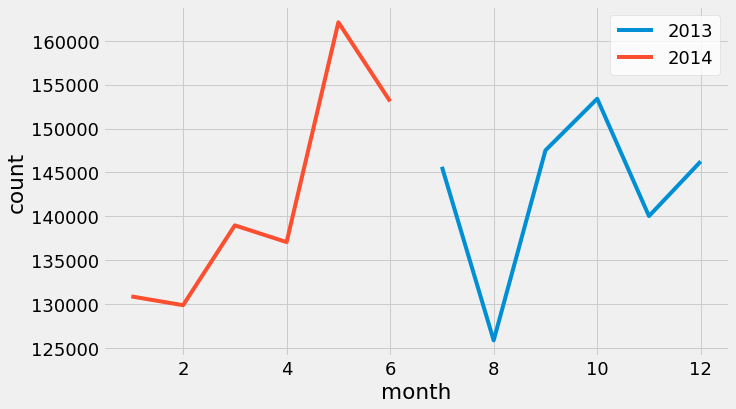

In [9]:
# Time series visualization
pivot = pd.pivot_table(train_df, index='month', columns="year", values="TRIP_ID", aggfunc="count").reset_index()

# Visualization, per month count
with plt.style.context("fivethirtyeight"):
    plt.figure(figsize=(10,6))
    plt.rcParams["font.size"] = 18
    plt.plot(pivot["month"], pivot[2013], label="2013")
    plt.plot(pivot["month"], pivot[2014], label="2014")
    plt.xlabel("month")
    plt.ylabel("count")
    plt.legend(facecolor="white")

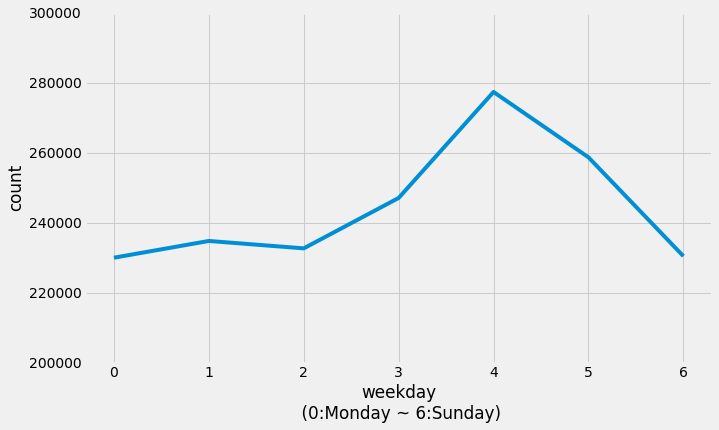

In [11]:
# weekday, groupby whole data
weekday = pd.DataFrame(data=train_df.groupby("weekday").TRIP_ID.count()).reset_index()

with plt.style.context("fivethirtyeight"):
    plt.figure(figsize=(10,6))
    
    plt.plot(weekday["weekday"], weekday["TRIP_ID"])
    plt.xlabel("weekday\n (0:Monday ~ 6:Sunday)")
    plt.ylabel("count")
    plt.ylim([200000, 300000])

In [38]:
# weekday, groupby whole data
hour = pd.DataFrame(data=train_df.groupby("hour").TRIP_ID.count()).reset_index()
hour.head()

,hour,TRIP_ID
0,0,49091
1,1,48542
2,2,48252
3,3,55147
4,4,58301


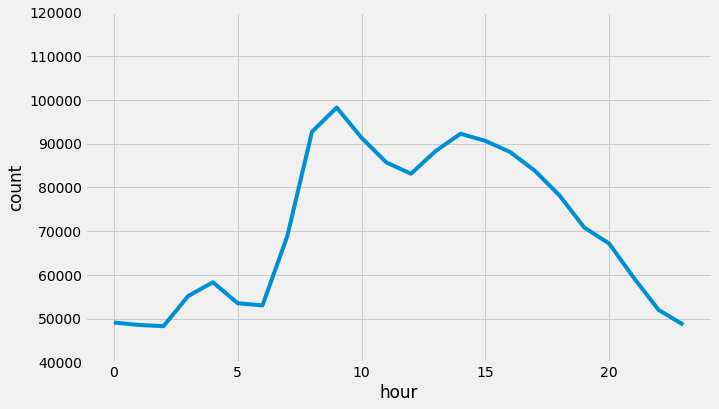

In [41]:
# weekday, groupby whole data
hour = pd.DataFrame(data=train_df.groupby("hour").TRIP_ID.count()).reset_index()

with plt.style.context("fivethirtyeight"):
    plt.figure(figsize=(10,6))
    
    plt.plot(hour["hour"], hour["TRIP_ID"])
    plt.xlabel("hour")
    plt.ylabel("count")
    plt.ylim([40000, 120000])

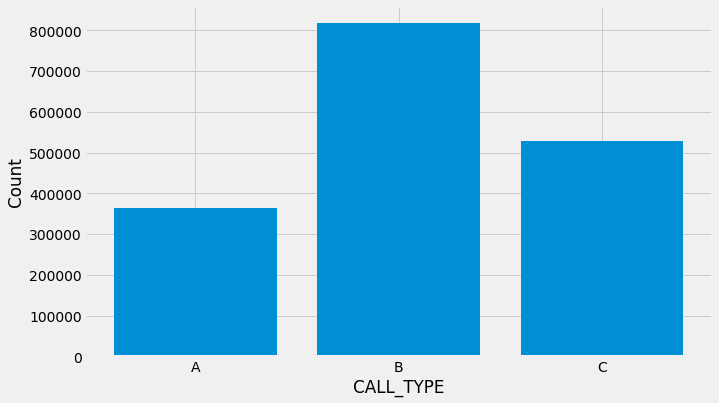

In [12]:
### Call type
call_type = pd.DataFrame(data=train_df.groupby("CALL_TYPE").TRIP_ID.count()).reset_index()

# visualization
with plt.style.context("fivethirtyeight"):
    plt.figure(figsize=(10,6))
    plt.bar(call_type["CALL_TYPE"], call_type["TRIP_ID"])
    plt.xlabel("CALL_TYPE")
    plt.ylabel("Count")

# Sampling 1st & last ride coordinate and last coordinate

In [13]:
# 1st long
lists_1st_lon = []
for i in range(0,len(train_df["POLYLINE"])):
    if train_df["POLYLINE"][i] == '[]':
        k=0
        lists_1st_lon.append(k)
    else:
        k = re.sub(r"[[|[|]|]|]]", "", train_df["POLYLINE"][i]).split(",")[0]
        lists_1st_lon.append(k)
        
train_df["lon_1st"] = lists_1st_lon

# 1st lat
lists_1st_lat = []
for i in range(0,len(train_df["POLYLINE"])):
    if train_df["POLYLINE"][i] == '[]':
        k=0
        lists_1st_lat.append(k)
    else:
        k = re.sub(r"[[|[|]|]|]]", "", train_df["POLYLINE"][i]).split(",")[1]
        lists_1st_lat.append(k)
        
train_df["lat_1st"] = lists_1st_lat

In [14]:
# last long
lists_last_lon = []
for i in range(0,len(train_df["POLYLINE"])):
        if train_df["POLYLINE"][i] == '[]':
            k=0
            lists_last_lon.append(k)
        else:
            k = re.sub(r"[[|[|]|]|]]", "", train_df["POLYLINE"][i]).split(",")[-2]
            lists_last_lon.append(k)

train_df["lon_last"] = lists_last_lon

# last lat
lists_last_lat = []
for i in range(0,len(train_df["POLYLINE"])):
    if train_df["POLYLINE"][i] == '[]':
        k=0
        lists_last_lat.append(k)
    else:
        k = re.sub(r"[[|[|]|]|]]", "", train_df["POLYLINE"][i]).split(",")[-1]
        lists_last_lat.append(k)
        
train_df["lat_last"] = lists_last_lat

In [20]:
# Delete lon & lat have "0".
train_df = train_df.query("lon_last != 0")

In [21]:
train_df["lon_1st"] = [float(k) for k in train_df["lon_1st"]]
train_df["lat_1st"] = [float(k) for k in train_df["lat_1st"]]
train_df["lon_last"] = [float(k) for k in train_df["lon_last"]]
train_df["lat_last"] = [float(k) for k in train_df["lat_last"]]

In [22]:
# Visualization, sampling 5000 datas.
mapping_1st = pd.DataFrame({
    "date":train_df.head(5000)["dt"].values,
    "lat":train_df.head(5000)["lat_1st"].values,
    "lon":train_df.head(5000)["lon_1st"].values
})

mapping_last = pd.DataFrame({
    "date":train_df.head(5000)["dt"].values,
    "lat":train_df.head(5000)["lat_last"].values,
    "lon":train_df.head(5000)["lon_last"].values
})

por_map = folium.Map(location=[41.141412,-8.590324], tiles='Stamen Terrain', zoom_start=11)

for i, r in mapping_1st.iterrows():
    folium.CircleMarker(location=[r["lat"],r["lon"]], radius=0.5, color="red").add_to(por_map)

for i, r in mapping_last.iterrows():
    folium.CircleMarker(location=[r["lat"],r["lon"]], radius=0.5, color="blue").add_to(por_map)    
    
por_map

In [42]:
por_map = folium.Map(location=[41.141412,-8.590324], tiles='Stamen Terrain', zoom_start=11)

for i, r in mapping_1st.iterrows():
    folium.CircleMarker(location=[r["lat"],r["lon"]], radius=0.5, color="red").add_to(por_map)
por_map

In [43]:
por_map = folium.Map(location=[41.141412,-8.590324], tiles='Stamen Terrain', zoom_start=11)

for i, r in mapping_last.iterrows():
    folium.CircleMarker(location=[r["lat"],r["lon"]], radius=0.5, color="blue").add_to(por_map)    
por_map 

Distance

In [23]:
train_df["delta_lon"] = train_df["lon_last"] - train_df["lon_1st"]
train_df["delta_lat"] = train_df["lat_last"] - train_df["lat_1st"]

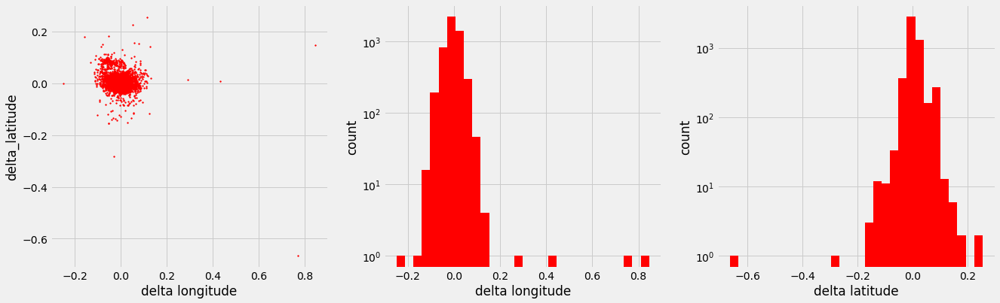

In [24]:
# sampling : 5,000 point
sample = train_df.head(5000)

with plt.style.context("fivethirtyeight"):
    fig, ax = plt.subplots(1,3,figsize=(20, 6))
    
    # plot
    ax[0].scatter(sample["delta_lon"], sample["delta_lat"], s=3, c="red")
    ax[0].set_xlabel("delta longitude")
    ax[0].set_ylabel("delta_latitude")
    
    # delta longitude distribution
    ax[1].hist(sample["delta_lon"], bins=30, color="red")
    ax[1].set_xlabel("delta longitude")
    ax[1].set_ylabel("count")
    ax[1].set_yscale("log")
    
    # delta latitude distribution
    ax[2].hist(sample["delta_lat"], bins=30, color="red")
    ax[2].set_xlabel("delta latitude")
    ax[2].set_ylabel("count")
    ax[2].set_yscale("log")

In [25]:
# monthly, delta longtitude & latitude boxplot
train_df["month_str"] = [str(i) for i in train_df["month"]]

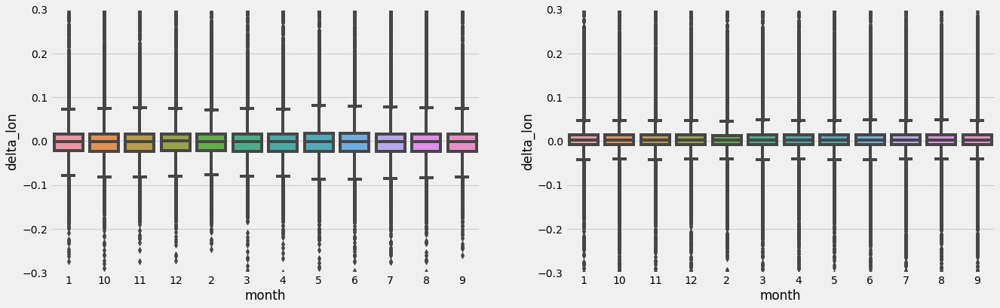

In [26]:
with plt.style.context("fivethirtyeight"):
    fig, ax = plt.subplots(1,2, figsize=(20,6))
    # delta_lon
    sns.boxplot("month_str", "delta_lon", data=train_df, ax=ax[0])
    ax[0].set_xlabel("month")
    ax[0].set_ylabel("delta_lon")
    ax[0].set_ylim([-0.3,0.3])
    # delta_lat
    sns.boxplot("month_str", "delta_lat", data=train_df, ax=ax[1])
    ax[1].set_xlabel("month")
    ax[1].set_ylabel("delta_lon")
    ax[1].set_ylim([-0.3,0.3])

Data Preprocessing


To predict the point(longitude & latitude), I tried to change some feature categorical numerical values.

Call type : A: 1, B: 2, C:3

Origin_call : data exist: 1, null: 0

Origin stand : data exist: 1, null: 0

Day tyoe : Only A, so this variable is no used.

Missing data : True: 1, False=0

And Exclude outliers


delta_lon & delta_lat : Over +0.2, or Under -0.2 is excluded.

In [27]:
# copy dataframe
df_ml = train_df.copy()

# outlier is dropped
df_ml = df_ml.query("delta_lon <= 0.2 & delta_lon >= -0.2 & delta_lat <= 0.2 & delta_lat >= -0.2")

In [28]:
# Call type <= 0.2 & delta_lon>=
map_call = {"A":1, "B":2, "C":3}
df_ml["Call_type"] = df_ml["CALL_TYPE"].map(map_call)

# Origin_call
def origin_call_flg(x):
    if x["ORIGIN_CALL"] == None:
        res = 0
    else:
        res = 1
    return res
df_ml["ORIGIN_CALL"] = df_ml.apply(origin_call_flg, axis=1)

# Origin_stand
def origin_stand_flg(x):
    if x["ORIGIN_STAND"] == None:
        res = 0
    else:
        res=1
    return res
df_ml["ORIGIN_STAND"] = df_ml.apply(origin_stand_flg, axis=1)

# Day type
df_ml.drop("DAY_TYPE", axis=1, inplace=True)

# Missing data
def miss_flg(x):
    if x["MISSING_DATA"] == "False":
        res = 0
    else:
        res = 1
    return res
df_ml["MISSING_DATA"] = df_ml.apply(miss_flg, axis=1)

Sampling 50000(≒3%) data and Select ML parameters


Since 1.7 million data is too large and the calculation load is high, 20000 data is randomly selected.

In [114]:
df_ml = df_ml.sample(50000)
X = df_ml[["Call_type", 'ORIGIN_CALL', 'ORIGIN_STAND', 'MISSING_DATA', 'lon_1st', 'lat_1st']]
y = df_ml[["lon_last","lat_last"]]

Prediction with Random forest regression

train test split

In [115]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

In [116]:
forest = MultiOutputRegressor(RandomForestRegressor(n_estimators=100, random_state=1))

# Fitting
forest = forest.fit(X_train, y_train)

In [117]:
y_train_pred = forest.predict(X_train)
y_test_pred = forest.predict(X_test)

Validation


MSE

In [118]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

In [119]:
print("MSE train:{}".format(mean_squared_error(y_train, y_train_pred)))
print("MSE test;{}".format(mean_squared_error(y_test, y_test_pred)))

print("R2 score train:{}".format(r2_score(y_train, y_train_pred)))
print("R2 score test:{}".format(r2_score(y_test, y_test_pred)))

MSE train:0.0002033884018670951
MSE test;0.000901962344847702
R2 score train:0.7578157745422741
R2 score test:-0.09450689825201541


In [120]:
y_test_point = X_test[['lat_1st','lon_1st']]
y_test_point.columns = ['lat', 'lon']
y_test_point = y_test_point.reset_index()
y_test_point = y_test_point.drop(columns=['index'])

In [121]:
y_test_actual = y_test[['lat_last','lon_last']]
y_test_actual.columns = ['lat', 'lon']
y_test_actual = y_test_actual.reset_index()
y_test_actual = y_test_actual.drop(columns=['index'])

In [122]:
y_predicted_point = pd.DataFrame(data=y_test_pred[0:,0:],    # values
                                 columns=["lon", "lat"])  # 1st row as the column names

In [123]:
y_test_point_sample = y_test_point.iloc[0:10]
y_predicted_point_sample = y_predicted_point.iloc[0:10]
y_test_actual_sample = y_test_actual.iloc[0:10]


por_map = folium.Map(location=[41.141412,-8.590324], tiles='Stamen Terrain', zoom_start=11)

for i, r in y_test_point_sample.iterrows():
    folium.CircleMarker(location=[r["lat"],r["lon"]], radius=0.5, color="red").add_to(por_map)

for i, r in y_predicted_point_sample.iterrows():
    folium.CircleMarker(location=[r["lat"],r["lon"]], radius=0.5, color="blue").add_to(por_map)    

for i, r in y_test_actual_sample.iterrows():
    folium.CircleMarker(location=[r["lat"],r["lon"]], radius=0.5, color="green").add_to(por_map)    
    
por_map

With Time variables

In [96]:
X = df_ml[["Call_type", 'ORIGIN_CALL', 'ORIGIN_STAND', 'MISSING_DATA', 'lon_1st', 'lat_1st', 'month', 'hour', 'day']]
y = df_ml[["lon_last","lat_last"]]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

In [97]:
forest = MultiOutputRegressor(RandomForestRegressor(n_estimators=100, random_state=1))

# Fitting
forest = forest.fit(X_train, y_train)

In [98]:
y_train_pred = forest.predict(X_train)
y_test_pred = forest.predict(X_test)

In [99]:
print("MSE train:{}".format(mean_squared_error(y_train, y_train_pred)))
print("MSE test;{}".format(mean_squared_error(y_test, y_test_pred)))

print("R2 score train:{}".format(r2_score(y_train, y_train_pred)))
print("R2 score test:{}".format(r2_score(y_test, y_test_pred)))

MSE train:0.00010966683700459233
MSE test;0.0007925565966641629
R2 score train:0.8669684510273059
R2 score test:0.0643258968533052
